# Classification of very high resolution satellite images using fully convolutional networks

In this exercise, we demonstrate how to produce maps of informal settlements out of very high resolution satellite images using fully convolutional networks. The dataset is subset of the image tiles used in [1]. The tiles came from a pan-sharpened Quickbird satellite of the city of Dar es Salaam image acquired in 2007. It is composed of four multispectral bands having a spatial resolution of 60 cm. The task is formulated as a binary classification problem distinguishing "informal settlements" from "others" class. Unlike the previous exercise in which we assign a single label for an image patch, here we classify each pixel according to the two aformentioned classes.

#### Import modules

In [ ]:
import tensorflow as tf
import dlmodels
import tensorflow.keras.models as models
import tensorflow.keras.optimizers as optimizers
import tensorflow.keras.utils as kutils
import sklearn.ensemble
import sklearn.metrics
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import pandas
import os

2022-10-04 11:22:29.453854: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-04 11:22:29.535006: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


First, we initialize the random number generator with a predefined seed to make our results reproducible.

In [ ]:
SEED = 42
np.random.seed(SEED)

## Part 1: Loading, structuring, and visualizing your input data

In this part of the exercise, we load the images as numpy arrays and visualize the results. After that, we define data structures for feeding the data right into DL models.

In [ ]:
# define dataset directory
BASE_DIR = "dataset"
IMAGE_DIR = os.path.join(BASE_DIR, "images")
LABEL_DIR = os.path.join(BASE_DIR, "labels")


# define constants
BANDS_COUNT = 4
CLASSES_COUNT = 2

PATCH_SIZE = 128
BATCH_SIZE = 16

EPOCHS = 15
STEPS = 200

TRAIN_IMAGES = ["1.tif", "2.tif", "3.tif", "4.tif", "7.tif"]
VAL_IMAGES = ["5.tif", "6.tif"]

# some of the labels correspond to classes not related to slum segmentation directly
# to process them we define mapping of them to out binary classification problem
CLASS_MAPPING = {
    1: 0, # background
    2: 1, # slums
    3: 0, # other, to background
    4: 0 # other, to background
}

In [ ]:
def read_image(image_path, normalise=False):
    with rasterio.open(image_path) as image_file:
        height, width, depth = image_file.height, image_file.width, image_file.count
        image_arr = np.empty((height, width, depth))
        for band_idx in range(depth):
            band_arr = image_file.read(band_idx + 1)
            if normalise:
                min_value = np.percentile(band_arr, 2)
                max_value = np.percentile(band_arr, 98)
                band_arr = (band_arr - min_value) / (max_value - min_value)
            image_arr[:, :, band_idx] = band_arr
    return image_arr


def map_classes(labels_arr, mapping=CLASS_MAPPING):
    labels_mapped = np.copy(labels_arr)
    for class_idx, target_idx in mapping.items():
        labels_mapped[labels_arr == class_idx] = target_idx
    return labels_mapped


def labels_to_onehot(labels_arr):
    height, width, _ = labels_arr.shape
    labels_arr = labels_arr[:, :, 0]
    labels_onehot = np.zeros((height, width, CLASSES_COUNT))
    for class_idx in range(CLASSES_COUNT):
        labels_onehot[:, :, class_idx][labels_arr == class_idx] = 1
    return labels_onehot


def pad_image_to_patch_size(image, patch_size=PATCH_SIZE):
    height, width, depth = image.shape
    target_height = patch_size * int(height // patch_size + 1)
    target_width = patch_size * int(width // patch_size + 1)
    pad_height = (target_height - height) // 2
    pad_width = (target_width - width) // 2
    padded = np.zeros((target_height, target_width, depth))
    padded[pad_height:pad_height + height, pad_width:pad_width + width, :] = image
    return padded, (pad_height, pad_width)

Let's visualise one training image from the dataset.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


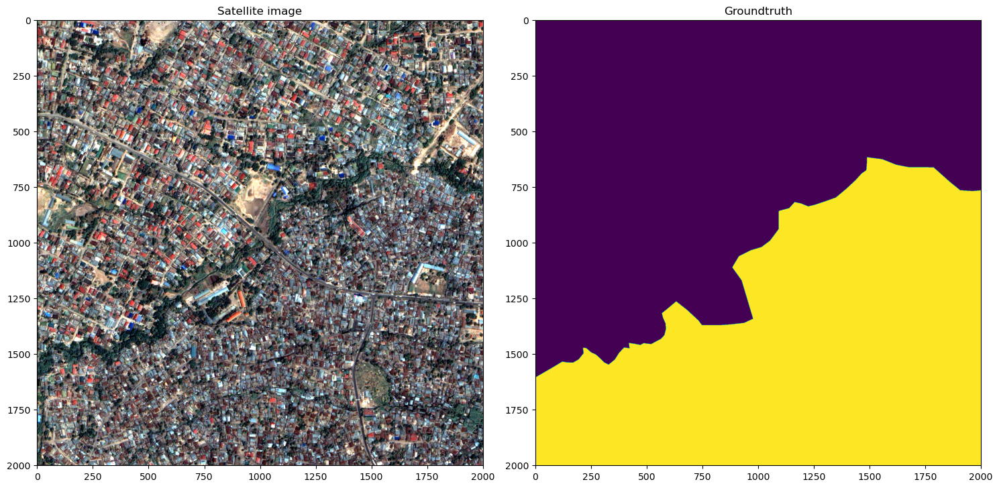

In [ ]:
image_filename = TRAIN_IMAGES[0]
image_path = os.path.join(IMAGE_DIR, image_filename)
label_path = os.path.join(LABEL_DIR, image_filename)

image_arr = read_image(image_path, normalise=True)
label_arr = read_image(label_path)
label_arr = map_classes(label_arr)

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

axs[0].imshow(image_arr[:, :, [2, 1, 0]])
axs[0].set_title("Satellite image")
axs[1].imshow(label_arr[:, :, 0])
axs[1].set_title("Groundtruth")

plt.tight_layout()
plt.show()

We then define two additional classes that deal with sampling of the input patches. For training, we sample the patches randomly, while for validation, as we have to perform validation on the same subset every time, we do it in a moving-window manner.

In [ ]:
class TrainSequence(kutils.Sequence):
    def __init__(self, filenames, batch_size, patch_size, len):
        self.filenames = filenames
        self.batch_size = batch_size
        self.patch_size = patch_size
        self.len = len
        self.read_dataset()

    def read_dataset(self):
        self.data = []
        for filename in self.filenames:
            image_path = os.path.join(IMAGE_DIR, filename)
            label_path = os.path.join(LABEL_DIR, filename)

            image = read_image(image_path, normalise=True)
            image, _ = pad_image_to_patch_size(image)

            label = read_image(label_path)
            label = map_classes(label)
            label, _ = pad_image_to_patch_size(label)
            label = labels_to_onehot(label)

            self.data.append((image, label))

    def __len__(self):
        return self.len

    def __getitem__(self, idx):
        batch_x = np.empty((self.batch_size, self.patch_size, self.patch_size, BANDS_COUNT))
        batch_y = np.empty((self.batch_size, self.patch_size, self.patch_size, CLASSES_COUNT))
        for patch_index in range(self.batch_size):
            image = self.sample_image()
            patch_image, patch_label = self.sample_patch(image)
            batch_x[patch_index] = patch_image
            batch_y[patch_index] = patch_label
        return batch_x, batch_y

    def sample_image(self):
        image_index = np.random.choice(len(self.data))
        image, label = self.data[image_index]
        return image, label

    def sample_patch(self, image_label_pair):
        image, label = image_label_pair
        height, width, _ = image.shape
        y = np.random.choice(height - self.patch_size)
        x = np.random.choice(width - self.patch_size)
        patch_image = image[y:y + self.patch_size, x:x + self.patch_size, :]
        patch_label = label[y:y + self.patch_size, x:x + self.patch_size, :]
        return patch_image, patch_label

[]

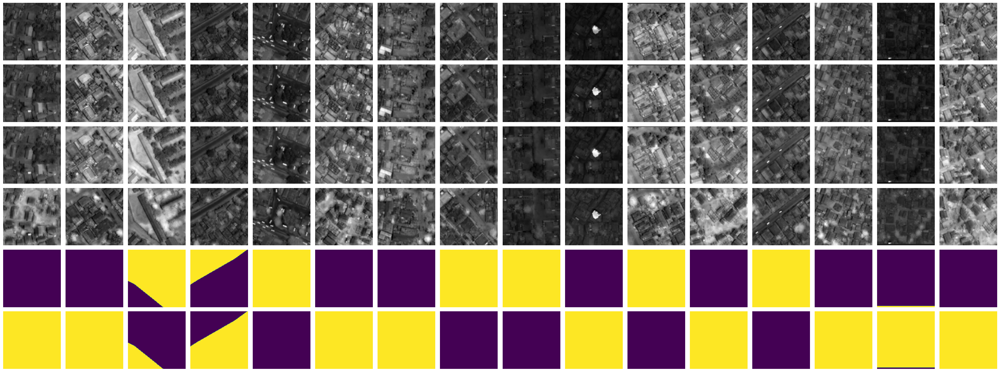

In [ ]:
train_sequence = TrainSequence(TRAIN_IMAGES, BATCH_SIZE, PATCH_SIZE, STEPS)

x, y = train_sequence[0]
nrows, ncols = BANDS_COUNT + CLASSES_COUNT, BATCH_SIZE
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(2*ncols, 2*nrows))

for index, (x_item, y_item) in enumerate(zip(x, y)):
    for row in range(BANDS_COUNT):
        axes[row][index].imshow(x_item[:, :, row], cmap="gray")
        axes[row][index].axis("off")
    for class_index in range(CLASSES_COUNT):
        row = BANDS_COUNT + class_index
        axes[row][index].imshow(y_item[:, :, class_index], vmin=0, vmax=1)
        axes[row][index].axis("off")

plt.tight_layout()
plt.plot()

In [ ]:
class ValSequence(kutils.Sequence):
    def __init__(self, filenames, batch_size, patch_size):
        self.filenames = filenames
        self.batch_size = batch_size
        self.patch_size = patch_size
        self.read_dataset()
        self.reset()

    def read_dataset(self):
        self.len = 0
        self.data = []
        for filename in self.filenames:
            image_path = os.path.join(IMAGE_DIR, filename)
            label_path = os.path.join(LABEL_DIR, filename)

            image = read_image(image_path, normalise=True)
            image, _ = pad_image_to_patch_size(image)

            label = read_image(label_path)
            label = map_classes(label)
            label, _ = pad_image_to_patch_size(label)
            label = labels_to_onehot(label)

            self.data.append((image, label))

            height, width, _ = image.shape
            patches_count = (height // self.patch_size) * (width // self.patch_size)
            self.len += patches_count

    def __len__(self):
        return self.len

    def __getitem__(self, idx):
        batch_x = np.empty((self.batch_size, self.patch_size, self.patch_size, BANDS_COUNT))
        batch_y = np.empty((self.batch_size, self.patch_size, self.patch_size, CLASSES_COUNT))
        for patch_index in range(self.batch_size):
            patch_image, patch_label = self.sample_patch()
            batch_x[patch_index] = patch_image
            batch_y[patch_index] = patch_label
        return batch_x, batch_y

    def sample_patch(self):
        image, label = self.sample_image()
        height, width, _ = image.shape

        if self.x + self.patch_size > width:
            self.x = 0
            self.y += self.patch_size
        if self.y + self.patch_size > height:
            self.y = 0
            self.x = 0
            self.image_index += 1
            image, label = self.sample_image()

        patch_image = image[self.y:self.y + self.patch_size, self.x:self.x + self.patch_size, :]
        patch_label = label[self.y:self.y + self.patch_size, self.x:self.x + self.patch_size, :]
        self.x += self.patch_size
        return patch_image, patch_label

    def sample_image(self):
        if self.image_index >= len(self.data):
            self.reset()
        image = self.data[self.image_index]
        return image

    def reset(self):
        self.image_index = 0
        self.x = 0
        self.y = 0

[]

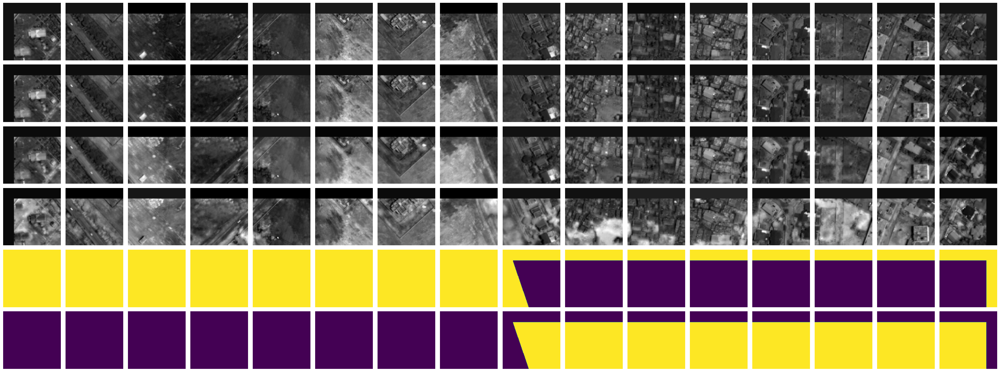

In [ ]:
val_sequence = ValSequence(VAL_IMAGES, BATCH_SIZE, PATCH_SIZE)

x, y = val_sequence[0]
nrows, ncols = BANDS_COUNT + CLASSES_COUNT, BATCH_SIZE
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(2*ncols, 2*nrows))

for index, (x_item, y_item) in enumerate(zip(x, y)):
    for row in range(BANDS_COUNT):
        axes[row][index].imshow(x_item[:, :, row], cmap="gray")
        axes[row][index].axis("off")
    for class_index in range(CLASSES_COUNT):
        row = BANDS_COUNT + class_index
        axes[row][index].imshow(y_item[:, :, class_index], vmin=0, vmax=1)
        axes[row][index].axis("off")

plt.tight_layout()
plt.plot()

<h3>Question 1:</h3>
<br>
What are the exact dimensions of the 4-D matrices for the training set?

Reset `val_sequence` so it is possible to reuse to later.

In [ ]:
val_sequence.reset()

## Part 2: Setting-up the network

Now we proceed on training our classifier in the form of a fully convolutional network. The network receives as an input the set of training patches we prepared in the previous step and produce output predictions of the same spatial dimensions (height and width) of the input. In total, you are suggested using five pre-implemented fully convolutional networks&mdash;DK3, DK6, SegNet, U-Net and DeepLabV3+. You can find them in the `dlmodels` module.

In [ ]:
dir(dlmodels)

['__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 'deeplab',
 'dk3',
 'dk6',
 'maxunpooling',
 'segnet',
 'unet']

Feel free to reuse the module and make changes.

Let's start our experiments with DK3.

In [ ]:
model = dlmodels.dk3((PATCH_SIZE, PATCH_SIZE, BANDS_COUNT), CLASSES_COUNT)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 zero_padding2d (ZeroPadding  (None, 132, 132, 4)      0         
 2D)                                                             
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 16)      1616      
                                                                 
 batch_normalization (BatchN  (None, 128, 128, 16)     64        
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 16)      0         
                                                                 
 zero_padding2d_1 (ZeroPaddi  (None, 132, 132, 16)     0         
 ng2D)                                                           
                                                        

2022-10-04 11:22:44.506358: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-04 11:22:44.543681: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-04 11:22:44.543890: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-04 11:22:44.544258: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFl

And in the same manner as in the previous practical, you can compile and fit the model easily.

In [ ]:
model.compile(
    loss="categorical_crossentropy",
    optimizer=optimizers.Adam(learning_rate=1e-3),
    metrics=["accuracy"]
)

history = model.fit(
    train_sequence,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1,
    validation_data=val_sequence
)

Epoch 1/15


2022-10-04 11:22:47.372003: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8401
2022-10-04 11:22:48.747754: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-10-04 11:22:48.748442: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-10-04 11:22:48.748475: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Couldn't invoke ptxas --version
2022-10-04 11:22:48.749161: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-10-04 11:22:48.749243: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2022-10-04 11:22:49.025243: I tensorflow/stream_executor/cuda/c

200/200 [==============================] - 13s 43ms/step - loss: 0.5791 - accuracy: 0.7018 - val_loss: 0.6520 - val_accuracy: 0.6366
Epoch 2/15
200/200 [==============================] - 8s 40ms/step - loss: 0.5214 - accuracy: 0.7447 - val_loss: 0.5757 - val_accuracy: 0.7000
Epoch 3/15
200/200 [==============================] - 8s 40ms/step - loss: 0.5175 - accuracy: 0.7489 - val_loss: 0.6617 - val_accuracy: 0.6851
Epoch 4/15
200/200 [==============================] - 8s 40ms/step - loss: 0.5121 - accuracy: 0.7517 - val_loss: 0.6821 - val_accuracy: 0.6728
Epoch 5/15
200/200 [==============================] - 8s 40ms/step - loss: 0.5089 - accuracy: 0.7525 - val_loss: 0.6030 - val_accuracy: 0.7324
Epoch 6/15
200/200 [==============================] - 8s 40ms/step - loss: 0.4948 - accuracy: 0.7613 - val_loss: 0.4426 - val_accuracy: 0.8091
Epoch 7/15
200/200 [==============================] - 8s 40ms/step - loss: 0.4970 - accuracy: 0.7603 - val_loss: 0.7633 - val_accuracy: 0.6653
Epoch 8/1

In [ ]:
# save the weight of the trained network
model.save_weights("dk3_weights.h5")

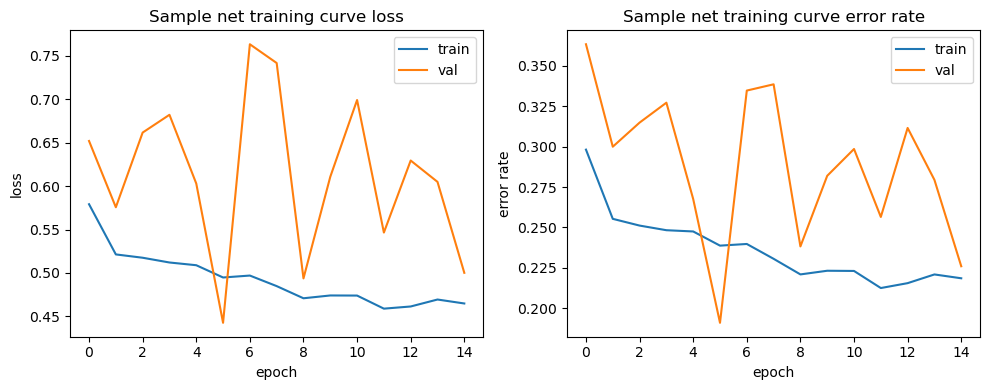

In [ ]:
# plot model training history
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axs[0].set_title("Sample net training curve loss")
axs[0].plot(history.history["loss"], label="train")
axs[0].plot(history.history["val_loss"], label="val")
axs[0].legend()
axs[0].set_ylabel("loss")
axs[0].set_xlabel("epoch")

axs[1].set_title("Sample net training curve error rate")
axs[1].plot([1 - _ for _ in history.history["accuracy"]], label="train")
axs[1].plot([1 - _ for _ in history.history["val_accuracy"]], label="val")
axs[1].legend()
axs[1].set_ylabel("error rate")
axs[1].set_xlabel("epoch")

plt.tight_layout()
plt.show()

In [ ]:
loss, accuracy = model.evaluate(val_sequence)
print(f"\nValidation accuracy of DK3: {100 * accuracy:.2f}%")

512/512 [==============================] - 4s 7ms/step - loss: 0.5002 - accuracy: 0.7741

Validation accuracy of DK3: 77.41%


In [ ]:
def apply_segmentation_with_fcn(image, fcn, patch_size=PATCH_SIZE, step=PATCH_SIZE//2):
    original_height, original_width, _ = image.shape
    padded, (pad_height, pad_width) = pad_image_to_patch_size(image, patch_size)
    height, width, _ = padded.shape

    predictions = np.zeros((height, width, CLASSES_COUNT))

    row = 0
    while row + patch_size <= height:
        row_patches = []

        col = 0
        while col + patch_size <= width:
            patch = padded[row:row + patch_size, col:col + patch_size, :]
            row_patches.append(patch)
            col += step

        batch = np.array(row_patches)
        row_predictions = fcn.predict(batch, verbose=0)

        col, patch_idx = 0, 0
        while col + patch_size <= width:
            predictions[row:row + patch_size, col:col + patch_size, :] += \
                row_predictions[patch_idx]
            col += step
            patch_idx += 1

        row += step

    predictions = predictions[
        pad_height:pad_height + original_height,
        pad_width:pad_width + original_width, :
    ]
    predictions = np.argmax(predictions, axis=-1)

    return predictions

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


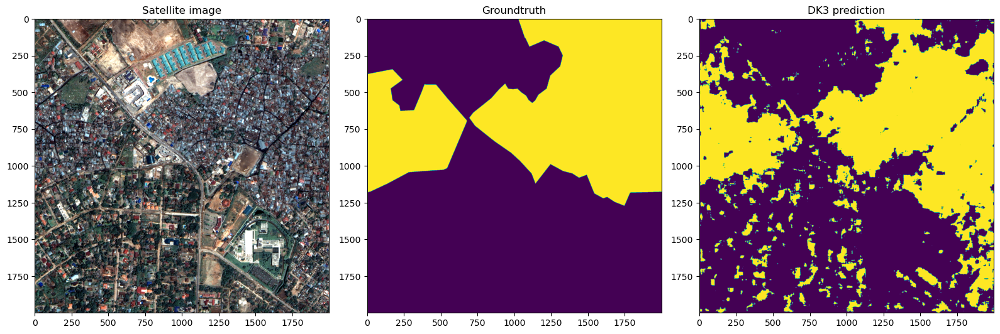

In [ ]:
# let's classify one scene completely and see the results
SCENE_IDX = 0
image_path = os.path.join(IMAGE_DIR, VAL_IMAGES[SCENE_IDX])
label_path = os.path.join(LABEL_DIR, VAL_IMAGES[SCENE_IDX])

image = read_image(image_path, normalise=True)
label = map_classes(read_image(label_path))

prediction = apply_segmentation_with_fcn(image, model)

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(16, 7))

axs[0].imshow(image[:, :, [2, 1, 0]])
axs[0].set_title("Satellite image")
axs[1].imshow(label[:, :, 0])
axs[1].set_title("Groundtruth")
axs[2].imshow(prediction)
axs[2].set_title("DK3 prediction")

plt.tight_layout()
plt.show()

## Part 3: Comparing with a pixel-based baseline model

Similar to the previous exercise, we now compare the performance of deep learning algorithms with simpler alternatives. Let's take for comparison random forests again.

In [ ]:
# read the training dataset
SAMPLES_PER_IMAGES = 10000

x_train = []
y_train = []

for filename in TRAIN_IMAGES:
    image_path = os.path.join(IMAGE_DIR, filename)
    label_path = os.path.join(LABEL_DIR, filename)

    image = read_image(image_path)
    label = map_classes(read_image(label_path))[:, :, 0]

    height, width, _ = image.shape
    image = image.reshape((height * width, -1))
    label = label.reshape((height * width))

    idx = np.random.randint(0, height * width, SAMPLES_PER_IMAGES)
    x = image[idx]
    y = label[idx]

    x_train.extend(x)
    y_train.extend(y)

In [ ]:
# train a random forest
classifier = sklearn.ensemble.RandomForestClassifier(
    n_estimators=100, max_depth=20, random_state=0
)
classifier.fit(x_train, y_train)

RandomForestClassifier(max_depth=20, random_state=0)

In [ ]:
# read the validation dataset
x_val = []
y_val = []

for filename in VAL_IMAGES:
    image_path = os.path.join(IMAGE_DIR, filename)
    label_path = os.path.join(LABEL_DIR, filename)

    image = read_image(image_path)
    label = map_classes(read_image(label_path))[:, :, 0]

    height, width, _ = image.shape
    image = image.reshape((height * width, -1))
    label = label.reshape((height * width))

    x_val.extend(image)
    y_val.extend(label)

In [ ]:
# and finally, evaluate the RF classifier on the validation set
prediction = classifier.predict(x_val)
accuracy = sklearn.metrics.accuracy_score(prediction, y_val)
print(f"\nValidation accuracy of RF: {100 * accuracy:.2f}%")


Validation accuracy of RF: 68.39%


In [ ]:
# let's classify one scene again and see the results
SCENE_IDX = 0
image_path = os.path.join(IMAGE_DIR, VAL_IMAGES[SCENE_IDX])
label_path = os.path.join(LABEL_DIR, VAL_IMAGES[SCENE_IDX])

image = read_image(image_path)
label = map_classes(read_image(label_path))

height, width, _ = image.shape
image_flatten = image.reshape((height * width, -1))
prediction = classifier.predict(image_flatten)
prediction = prediction.reshape((height, width))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


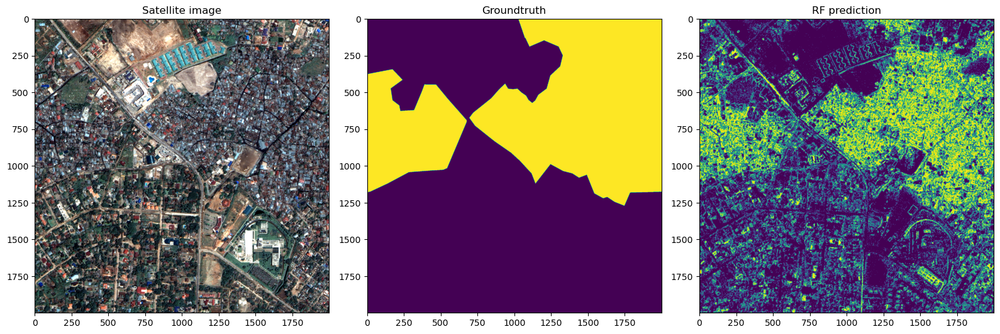

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(16, 7))

image_normalised = read_image(image_path, normalise=True)
axs[0].imshow(image_normalised[:, :, [2, 1, 0]])
axs[0].set_title("Satellite image")
axs[1].imshow(label[:, :, 0])
axs[1].set_title("Groundtruth")
axs[2].imshow(prediction, interpolation=None)
axs[2].set_title("RF prediction")

plt.tight_layout()
plt.show()

## Part 4: Assessing the classification accuracy of a pre-trained network

After training your own network, we suggest trying a pre-trained one. It will be a U-Net model fitted on the same dataset but for more epochs and with the use of data augmentation including patch flips and rotations. You can find the weight and training history in the `pretrained` directory.

In [ ]:
model = dlmodels.unet((PATCH_SIZE, PATCH_SIZE, BANDS_COUNT), CLASSES_COUNT)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 4  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_4 (Conv2D)              (None, 128, 128, 32  1184        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_3 (BatchNo  (None, 128, 128, 32  128        ['conv2d_4[0][0]']               
 rmalization)                   )                                                             

 batch_normalization_12 (BatchN  (None, 8, 8, 1024)  4096        ['conv2d_13[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 leaky_re_lu_12 (LeakyReLU)     (None, 8, 8, 1024)   0           ['batch_normalization_12[0][0]'] 
                                                                                                  
 up_sampling2d (UpSampling2D)   (None, 16, 16, 1024  0           ['leaky_re_lu_12[0][0]']         
                                )                                                                 
                                                                                                  
 conv2d_14 (Conv2D)             (None, 16, 16, 512)  4719104     ['up_sampling2d[0][0]']          
                                                                                                  
 batch_nor

                                                                                                  
 up_sampling2d_3 (UpSampling2D)  (None, 128, 128, 12  0          ['leaky_re_lu_21[0][0]']         
                                8)                                                                
                                                                                                  
 conv2d_23 (Conv2D)             (None, 128, 128, 64  73792       ['up_sampling2d_3[0][0]']        
                                )                                                                 
                                                                                                  
 batch_normalization_22 (BatchN  (None, 128, 128, 64  256        ['conv2d_23[0][0]']              
 ormalization)                  )                                                                 
                                                                                                  
 leaky_re_

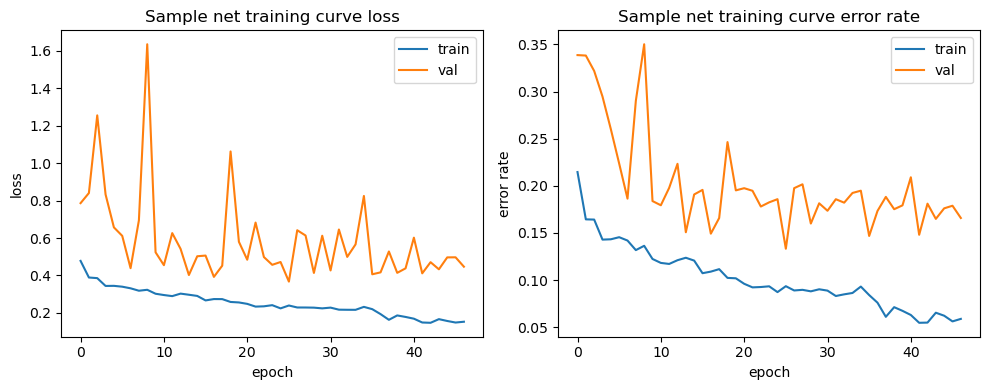

In [ ]:
# plot model training history
history = pandas.read_csv(os.path.join("pretrained", "pretrained_unet_history.csv"))
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axs[0].set_title("Sample net training curve loss")
axs[0].plot(history["loss"], label="train")
axs[0].plot(history["val_loss"], label="val")
axs[0].legend()
axs[0].set_ylabel("loss")
axs[0].set_xlabel("epoch")

axs[1].set_title("Sample net training curve error rate")
axs[1].plot([1 - _ for _ in history["accuracy"]], label="train")
axs[1].plot([1 - _ for _ in history["val_accuracy"]], label="val")
axs[1].legend()
axs[1].set_ylabel("error rate")
axs[1].set_xlabel("epoch")

plt.tight_layout()
plt.show()

In [ ]:
model.load_weights(os.path.join("pretrained", "pretrained_unet_weights.h5"))

In [ ]:
model.compile(
    loss="categorical_crossentropy",
    optimizer=optimizers.Adam(learning_rate=1e-3),
    metrics=["accuracy"]
)

loss, accuracy = model.evaluate(val_sequence)
print(f"\nValidation accuracy of U-Net: {100 * accuracy:.2f}%")

512/512 [==============================] - 17s 29ms/step - loss: 0.3669 - accuracy: 0.8669

Validation accuracy of U-Net: 86.69%


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


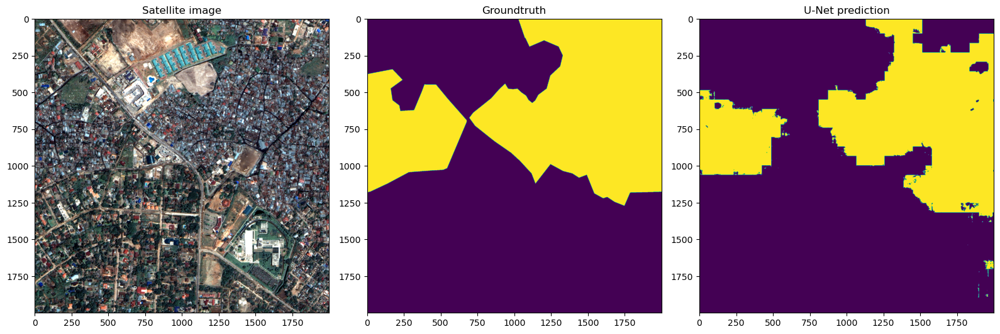

In [ ]:
# let's classify one scene completely and see the results
SCENE_IDX = 0
image_path = os.path.join(IMAGE_DIR, VAL_IMAGES[SCENE_IDX])
label_path = os.path.join(LABEL_DIR, VAL_IMAGES[SCENE_IDX])

image = read_image(image_path, normalise=True)
label = map_classes(read_image(label_path))

prediction = apply_segmentation_with_fcn(image, model)

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(16, 7))

axs[0].imshow(image[:, :, [2, 1, 0]])
axs[0].set_title("Satellite image")
axs[1].imshow(label[:, :, 0])
axs[1].set_title("Groundtruth")
axs[2].imshow(prediction)
axs[2].set_title("U-Net prediction")

plt.tight_layout()
plt.show()

## Part 5: Looking deeper into the pre-trained model

In this part, we visualise outputs from different layers of the pre-trained U-Net to get more insight about which features are learnt by the model.

In [ ]:
inputs = model.input
outputs = {}
output_names = []

for layer in model.layers:
    if layer.name.startswith("conv"):
        outputs[layer.name] = layer.output
        output_names.append(layer.name)

layers_model = models.Model(inputs=inputs, outputs=outputs)

1/1 [==============================] - 1s 902ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


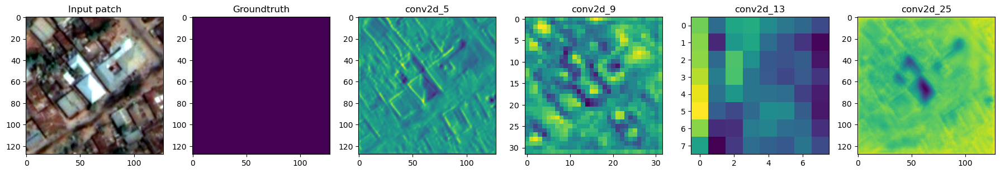

In [ ]:
x, y = train_sequence[0]
x = x[0][np.newaxis, :, :, :]
y = y[0]
prediction = layers_model.predict(x)

layers_to_visualise = [1, 5, 9, 21]

nrows, ncols = 1, 2 + len(layers_to_visualise)
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*3, nrows*3))

axs[0].imshow(x[0][:, :, [2, 1, 0]])
axs[0].set_title("Input patch")
axs[1].imshow(y[:, :, 1])
axs[1].set_title("Groundtruth")

for count, layer_idx in enumerate(layers_to_visualise):
    output_name = output_names[layer_idx]
    # visualise random channel of the output
    channel_idx = np.random.randint(0, prediction[output_name].shape[-1])
    axs[2 + count].imshow(prediction[output_name][0, :, :, channel_idx])
    axs[2 + count].set_title(output_name)

plt.tight_layout()
plt.show()